<a href="https://colab.research.google.com/github/Surfinfan/COVID-19/blob/master/AEI_Trabajo_Final_Exploracion_de_datos_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AEI - Trabajo final - **Competición DFC2025**

by
Manuel Patiño &

Antonio Muñoz

In [79]:
from google.colab import drive

import os
import math
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, BoundaryNorm
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from matplotlib.colors import ListedColormap
from IPython.display import Image


## Lectura de datos

Primero hacemos alguna lectura de una imagen cualquiera para hacernos una idea del formato, y luego leemos una cantidad n_images. Luego podremos variar esta cantidad, pero que durante las pruebas mantendremos a un valor reducido para que los algoritmos no tarden demasiado en ejecutarse

In [80]:
# Montamos la unidad de Drive
drive.mount('/content/drive')

# Definimos la ruta específica
path_drive = '/content/drive/My Drive/09. Master Teledeteccion/Trabajo Final AEI/Datos/'
path_imagenes = '/content/drive/My Drive/09. Master Teledeteccion/Trabajo Final AEI/Imagenes para Colab/'

# Cambiamos el directorio de trabajo actual a esa carpeta
os.chdir(path_drive)

# Verificamos dónde estamos y qué archivos hay
print("Directorio actual:", os.getcwd())
print("Archivos disponibles:", os.listdir())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Directorio actual: /content/drive/My Drive/09. Master Teledeteccion/Trabajo Final AEI/Datos
Archivos disponibles: ['val', 'test', 'train', 'histogramas_bandas.png']


In [81]:
# Leer ficheros

#base_ruta_opt = '/Users/antonio/Downloads/dfc25_track1_trainval/train/rgb_images/'
#base_ruta_sar = '/Users/antonio/Downloads/dfc25_track1_trainval/train/sar_images/'
#base_ruta_lab = '/Users/antonio/Downloads/dfc25_track1_trainval/train/labels/'

base_ruta_opt = 'train/rgb_images/'
base_ruta_sar = 'train/sar_images/'
base_ruta_lab = 'train/labels/'

fichero = 'TrainArea_227.tif'
ruta_archivo_opt = base_ruta_opt + fichero
ruta_archivo_sar = base_ruta_sar + fichero
ruta_archivo_lab = base_ruta_lab + fichero

if os.path.exists(ruta_archivo_opt) or os.path.exists(ruta_archivo_sar) or os.path.exists(ruta_archivo_lab):
    print("¡Archivo encontrado con éxito!")
else:
    print("Error: No se encuentra el archivo. Revisa la ruta.")

print("\nFichero optico\n---------------------")
with rasterio.open(ruta_archivo_opt) as src_opt:
    # Metadatos básicos
    print(f"Dimensiones: {src_opt.width} x {src_opt.height}")
    print(f"Número de bandas: {src_opt.count}")
    data_opt = src_opt.read()
    data_opt = data_opt.transpose(1, 2, 0)

print("\nFichero SAR\n---------------------")
with rasterio.open(ruta_archivo_sar) as src_sar:
    # Metadatos básicos
    print(f"Dimensiones: {src_sar.width} x {src_sar.height}")
    print(f"Número de bandas: {src_sar.count}")
    data_sar = src_sar.read()
    data_sar = data_sar.transpose(1, 2, 0)
    data_sar = np.squeeze(data_sar) # Ahora es 2D

print("\nFichero labels\n---------------------")
with rasterio.open(ruta_archivo_lab) as src_lab:
    # Metadatos básicos
    print(f"Dimensiones: {src_lab.width} x {src_lab.height}")
    print(f"Número de bandas: {src_lab.count}")
    data_lab = src_lab.read()
    data_lab = data_lab.transpose(1, 2, 0)
    data_lab = np.squeeze(data_lab) # Ahora es 2D

¡Archivo encontrado con éxito!

Fichero optico
---------------------


/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Dimensiones: 1024 x 1024
Número de bandas: 3

Fichero SAR
---------------------
Dimensiones: 1024 x 1024
Número de bandas: 1

Fichero labels
---------------------
Dimensiones: 1024 x 1024
Número de bandas: 1


In [82]:
# Cosas comunes

# Definición técnica de nombres y colores (Ajustado a 8 clases)
class_names = ['Bareland', 'Rangeland', 'Developed space', 'Road', 'Tree', 'Water', 'Agriculture land', 'Building']

colores_hex = [
    '#800000', # Bareland (Marrón/Granate)
    '#00FF24', # Rangeland (Verde claro)
    '#949494', # Developed space (Gris)
    '#FFFFFF', # Road (Blanco)
    '#226126', # Tree (Verde oscuro)
    '#0045FF', # Water (Azul)
    '#4BB549', # Agriculture land (Verde medio)
    '#DE1F07'  # Building (Rojo)
]

# Creamos el mapa de colores
cmap_clases = ListedColormap(colores_hex)

# Definimos los límites para que el valor 1 caiga en el primer color (índice 0)
# Los límites serán [1, 2, 3, 4, 5, 6, 7, 8, 9]
# El valor 1 estará en el rango [1, 2), el valor 8 en [8, 9)
bounds = np.arange(1, len(class_names) + 2)
norm_clases = BoundaryNorm(bounds, cmap_clases.N)

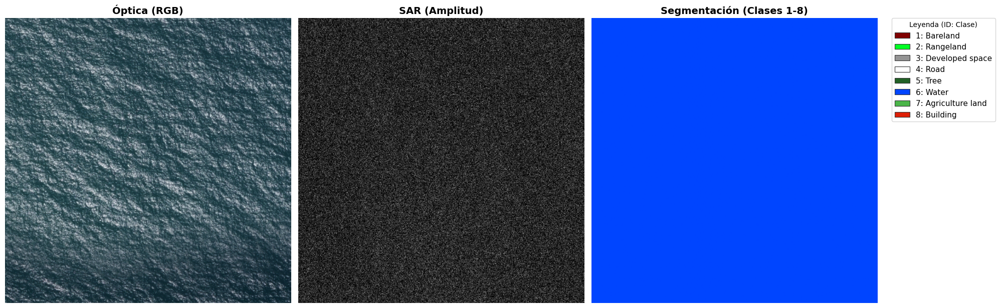

Valores reales en la máscara: [6]
ID 6: Water -> 1048576 píxeles


In [83]:

# Vemos alguna suelta para hacernos una idea

# Configuración de la figura
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# Visualización Óptica
axes[0].imshow(data_opt)
axes[0].set_title('Óptica (RGB)', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Visualización SAR (Aseguramos que sea 2D para imshow)
axes[1].imshow(data_sar, cmap='gray')
axes[1].set_title('SAR (Amplitud)', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Visualización de Segmentación (Labels 1-8)
im = axes[2].imshow(data_lab, cmap=cmap_clases, norm=norm_clases)
axes[2].set_title('Segmentación (Clases 1-8)', fontsize=14, fontweight='bold')
axes[2].axis('off')

# Creación de la leyenda
# Mapeamos correctamente cada color a su nombre
patches = [
    mpatches.Patch(
        facecolor=colores_hex[i],
        label=f"{i+1}: {class_names[i]}", # Mostramos el ID (1-8) y el nombre
        edgecolor='#333333',
        linewidth=0.8
    ) for i in range(len(class_names))
]

axes[2].legend(
    handles=patches,
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.,
    fontsize=11,
    title="Leyenda (ID: Clase)"
)

plt.tight_layout()
plt.show()

# --- Verificación de integridad ---
valores_unicos = np.unique(data_lab)
print(f"Valores reales en la máscara: {valores_unicos}")
for val in valores_unicos:
    if 1 <= val <= 8:
        print(f"ID {val}: {class_names[val-1]} -> {np.sum(data_lab == val)} píxeles")

In [84]:
# Vamos a elegir n_images imagenes al azar para leerlas y trabajar con ellas

n_images = 20
num_max = 4333

# Genera n_images números enteros entre 0 y num_max
np.random.seed(6)   # Por reproducibilidad
numeros = np.random.randint(0, num_max + 1, size=n_images)
numeros.sort()

lista_rgb = []
lista_sar = []
lista_labels = []

for n in numeros:
    # Lógica de formateo: 3 dígitos si < 1000, 4 o más si >= 1000
    # El formato :03d rellena con ceros a la izquierda hasta tener al menos 3 caracteres
    nombre_fichero = f"TrainArea_{n:03d}.tif"

    # Construimos y añadimos las rutas
    lista_rgb.append(os.path.join(base_ruta_opt, nombre_fichero))
    lista_sar.append(os.path.join(base_ruta_sar, nombre_fichero))
    lista_labels.append(os.path.join(base_ruta_lab, nombre_fichero))

# Verificación rápida
print(f"Procesadas {len(lista_rgb)} imágenes.")
print(f"Ejemplo de ruta: {lista_rgb[0]}")


Procesadas 20 imágenes.
Ejemplo de ruta: train/rgb_images/TrainArea_227.tif


In [85]:
# Vamos a leer esos ficheros

# Inicializamos las listas donde guardaremos los datos (arrays)
data_rgb = []
data_sar = []
data_labels = []

print("Iniciando la lectura de ficheros...")

# Usamos zip para recorrer las tres listas de rutas simultáneamente
for r_path, s_path, l_path in zip(lista_rgb, lista_sar, lista_labels):
    try:
        # Leer RGB
        with rasterio.open(r_path) as src:
            img_rgb = src.read() # Esto devuelve (Canales, Alto, Ancho)
            # Transponemos a (Alto, Ancho, Canales)
            img_rgb = np.transpose(img_rgb, (1, 2, 0))
            data_rgb.append(img_rgb)

        # Leer SAR
        with rasterio.open(s_path) as src:
            img_sar = src.read() # Esto devuelve (Canales, Alto, Ancho)
            # Transponemos a (Alto, Ancho, Canales)
            img_sar = np.transpose(img_sar, (1, 2, 0))
            data_sar.append(img_sar)

        # Leer Labels
        with rasterio.open(l_path) as src:
            # src.read(1) lee solo la primera banda y ya devuelve una matriz 2D (Alto, Ancho)
            # Así que este está perfecto tal cual, no necesita transpose.
            data_labels.append(src.read(1))

    except Exception as e:
        print(f"Error al leer el set de ficheros para una imagen: {e}")

print(f"Lectura completada. Imágenes cargadas: {len(data_rgb)}")

Iniciando la lectura de ficheros...
Lectura completada. Imágenes cargadas: 20


In [88]:
#Función auxiliar para estirar el contraste (2-98%) en RGB y Gris

def preparar_imagen_vis(img_raw):

    img = img_raw.copy()
    if len(img.shape) == 3 and img.shape[2] == 1:
        img = np.squeeze(img)

    if len(img.shape) == 3: # RGB
        img_rgb = img[:, :, 0:3]
        mask = img_rgb > 0
        pixels_validos = img_rgb[mask.any(axis=2)]
        if pixels_validos.size > 0:
            p2, p98 = np.percentile(pixels_validos, (2, 98))
        else:
            p2, p98 = 0, 1
        return np.clip((img_rgb - p2) / (p98 - p2 + 1e-8), 0, 1)
    else: # Gris
        mask = img > 0
        pixels_validos = img[mask]
        if pixels_validos.size > 0:
            p2, p98 = np.percentile(pixels_validos, (2, 98))
        else:
            p2, p98 = img.min(), img.max()
        return np.clip((img - p2) / (p98 - p2 + 1e-8), 0, 1)

# Funcion para mostrar trios de imágenes de 3 en 3, en un grid de 6 columnas

def mostrar_trios_imagenes(lista_rgb, lista_gris, lista_labels, cmap_personal, norm_personal, titulos_grupos=None):

    num_grupos = len(lista_rgb)
    ncols = 6

    # Cada grupo ocupa 3 columnas. Caben 2 grupos por fila.
    nrows = math.ceil(num_grupos / 2)
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 3.5 * nrows))

    # Aplanamos el grid de ejes para iterar fácilmente
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]

    for g in range(num_grupos):
        # Índices base en el grid aplastado (cada grupo avanza 3 posiciones)
        idx_base = g * 3

        # --- 1. IMAGEN RGB ---
        img_rgb = preparar_imagen_vis(lista_rgb[g])
        axes[idx_base].imshow(img_rgb, aspect='equal')
        if titulos_grupos:
            axes[idx_base].set_title(f"{titulos_grupos[g]} (RGB)", fontsize=11)
        axes[idx_base].axis('off')

        # --- 2. IMAGEN SAR ---
        img_gris = preparar_imagen_vis(lista_gris[g])
        axes[idx_base + 1].imshow(img_gris, cmap='gray', aspect='equal')
        if titulos_grupos:
            axes[idx_base + 1].set_title(f"{titulos_grupos[g]} (SAR)", fontsize=11)
        axes[idx_base + 1].axis('off')

        # --- 3. IMAGEN LABELS ---
        img_label = lista_labels[g]
        if img_label.ndim == 3: # Asegurar que es 2D para aplicar el colormap
            img_label = np.squeeze(img_label)

        # vmin y vmax aseguran que el valor 0 tome el primer color, el 1 el segundo, etc.
        # interpolation='nearest' es vital para que Matplotlib no "difumine" los bordes de las clases
        axes[idx_base + 2].imshow(
            img_label,
            cmap=cmap_personal,
            norm = norm_personal,
            #vmin=0,
            #vmax=len(colores_hex) - 1,
            aspect='equal',
            interpolation='nearest'
        )
        if titulos_grupos:
            axes[idx_base + 2].set_title(f"{titulos_grupos[g]} (Labels)", fontsize=11)
        axes[idx_base + 2].axis('off')

    # Limpiamos (ocultamos) los ejes que hayan sobrado si los grupos son impares
    total_plots_usados = num_grupos * 3
    for i in range(total_plots_usados, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

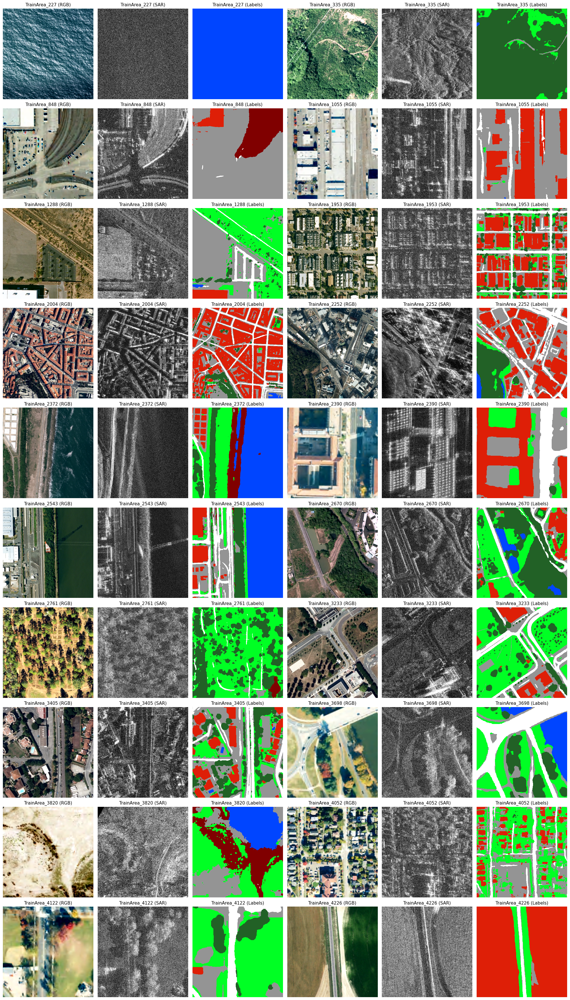

In [89]:
# Llamo a la funcion para ver esas imágenes

lista_nombres = [f"TrainArea_{n:03d}" for n in numeros]

mostrar_trios_imagenes(
    lista_rgb = data_rgb,
    lista_gris = data_sar,
    lista_labels = data_labels,
    cmap_personal = cmap_clases,
    norm_personal = norm_clases,
    titulos_grupos = lista_nombres
)

## Preparación de datos de Entrenamiento y Test

Partimos de las n_images imágenes cargadas. Creamos tres test de entrenamiento y test


1.   Sólo datos de imágenes ópticas
2.   Sólo datos de imágenes de radar
3.   Datos ópticos + radar


<img src="https://github.com/Surfinfan/TrabajoAEI/raw/56cc68404c37789cd6382048f08370ec0d15b36e/images/Esquema%20de%20transformar%20imagenes%20training.png" width="1000">



In [ ]:
# Vamos a explorar un poco los datos antes de prepararlos para el entrenamiento

# Creamos el cubo de datos (n, 1024, 1024, 4)
X = np.array([np.concatenate([rgb, sar], axis=-1)
              for rgb, sar in zip(data_rgb, data_sar)])

# Configuración de la figura
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Nombres y colores para identificar cada banda
band_names = ['Banda 1: Rojo (Red)', 'Banda 2: Verde (Green)',
              'Banda 3: Azul (Blue)', 'Banda 4: SAR (Módulo)']
colors = ['red', 'green', 'blue', 'gray']

# Iterar sobre las 4 capas para graficar
for i in range(4):
    # Extraemos todos los píxeles de la banda i de todas las imágenes
    band_pixels = X[:, :, :, i].flatten()

    # Graficamos el histograma
    axes[i].hist(band_pixels, bins=100, color=colors[i], alpha=0.7, edgecolor='none')
    axes[i].set_title(band_names[i], fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Valor del Píxel')
    axes[i].set_ylabel('Frecuencia (Nº de píxeles)')
    axes[i].grid(axis='y', alpha=0.3)

    # Opcional: Si el SAR tiene valores muy extremos, podrías usar escala logarítmica
    # if i == 3: axes[i].set_yscale('log')

plt.tight_layout()
plt.savefig('histogramas_bandas.png')
plt.show()

In [ ]:

# Convertir listas a arrays de numpy
# X tendrá forma (n, 1024, 1024, 4)
X = np.array([np.concatenate([rgb, sar], axis=-1)
              for rgb, sar in zip(data_rgb, data_sar)])

# y tendrá forma (n, 1024, 1024)
y = np.array(data_labels)

print(f"Forma del set de características (X): {X.shape}")
print(f"Forma del set de etiquetas (y): {y.shape}")

In [ ]:
# queremos que los datos normalizados y entre 0 y 1

def normalize_data(X):
    X_norm = np.zeros_like(X, dtype=np.float32)
    for b in range(X.shape[-1]):
        band = X[..., b]
        # Clipping de outliers (percentiles 2 y 98) para evitar sesgos
        p2, p98 = np.percentile(band, (2, 98))
        band = np.clip(band, p2, p98)
        # Min-Max Scaling
        X_norm[..., b] = (band - p2) / (p98 - p2)
    return X_norm

X_scaled = normalize_data(X)



In [ ]:
# Vamos a explorar un poco los datos antes de prepararlos para el entrenamiento


# Configuración de la figura
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Iterar sobre las 4 capas para graficar
for i in range(4):
    # Extraemos todos los píxeles de la banda i de todas las imágenes
    band_pixels = X_scaled[:, :, :, i].flatten()

    # Graficamos el histograma
    axes[i].hist(band_pixels, bins=80, color=colors[i], alpha=0.7, edgecolor='none')
    axes[i].set_title(band_names[i], fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Valor del Píxel')
    axes[i].set_ylabel('Frecuencia (Nº de píxeles)')
    axes[i].grid(axis='y', alpha=0.3)

    # Opcional: Si el SAR tiene valores muy extremos, podrías usar escala logarítmica
    # if i == 3: axes[i].set_yscale('log')

plt.tight_layout()
plt.savefig('histogramas_bandas.png')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
cmap_labels = ListedColormap(colores_hex)
def plot_sample(idx):
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Mostrar RGB
    ax[0].imshow(X[idx][..., :3].astype(np.uint8))
    ax[0].set_title("Imagen RGB")

    # Mostrar SAR (Banda 4) con mapa de color específico
    ax[1].imshow(X[idx][..., 3], cmap='viridis')
    ax[1].set_title("Capa SAR (Módulo)")

    # Mostrar Ground Truth
    ax[2].imshow(y[idx], cmap=cmap_clases)
    ax[2].set_title("Ground Truth Labels")

    plt.show()

plot_sample(1)

In [ ]:
cmap_clases

In [ ]:
data_sar[0].shape